<h1><center>Laboratorio 4: La solicitud de Mathias 🤗</center></h1>

<center><strong>MDS7202: Laboratorio de Programación Científica para Ciencia de Datos - Primavera 2025</strong></center>

### Cuerpo Docente:

- Profesores: Diego Cortez, Gabriel Iturra
- Auxiliares: Melanie Peña, Valentina Rojas
- Ayudantes: Nicolás Cabello, Cristopher Urbina

### Equipo: SUPER IMPORTANTE - notebooks sin nombre no serán revisados

- Nombre de alumno 1: Esteban Araneda
- Nombre de alumno 2: Ignacio Reyes


### **Link de repositorio de GitHub:** [Repositorio grupo OVNI](https://github.com/estebanaraneda/MDS7202_OVNI)

## Temas a tratar
- Aplicar Pandas para obtener características de un DataFrame.
- Aplicar Pipelines y Column Transformers.
- Utilizar diferentes algoritmos de cluster y ver el desempeño.

## Reglas:

- **Grupos de 2 personas**
- Fecha de entrega: Entregas Martes a las 23:59.
- Instrucciones del lab el viernes a las 16:15 en formato online. Asistencia no es obligatoria, pero se recomienda **fuertemente** asistir.
- <u>Prohibidas las copias</u>. Cualquier intento de copia será debidamente penalizado con el reglamento de la escuela.
- Tienen que subir el laboratorio a u-cursos y a su repositorio de github. Labs que no estén en u-cursos no serán revisados. Recuerden que el repositorio también tiene nota.
- Cualquier duda fuera del horario de clases al foro. Mensajes al equipo docente serán respondidos por este medio.
- Pueden usar cualquier material del curso que estimen conveniente.

### Objetivos principales del laboratorio
- Comprender cómo aplicar pipelines de Scikit-Learn para generar clusters.
- Familiarizarse con plotly.

El laboratorio deberá ser desarrollado sin el uso indiscriminado de iteradores nativos de python (aka "for", "while"). La idea es que aprendan a exprimir al máximo las funciones optimizadas que nos entrega `numpy`, las cuales vale mencionar, son bastante más eficientes que los iteradores nativos sobre arreglos (*o tensores*).

## Descripción del laboratorio

<center>
<img src="https://i.pinimg.com/originals/5a/a6/af/5aa6afde8490da403a21601adf7a7240.gif" width=400 />

En el corazón de las operaciones de Aerolínea Lucero, Mathias, el gerente de análisis de datos, reunió a un talentoso equipo de jóvenes científicos de datos para un desafío crucial: segmentar la base de datos de los clientes. “Nuestro objetivo es descubrir patrones en el comportamiento de los pasajeros que nos permitan personalizar servicios y optimizar nuestras campañas de marketing,” explicó Mathias, mientras desplegaba un amplio rango de datos que incluían desde hábitos de compra hasta opiniones sobre los vuelos.

Mathias encargó a los científicos de datos la tarea de aplicar técnicas avanzadas de clustering para identificar distintos segmentos de clientes, como los viajeros frecuentes y aquellos que eligen la aerolínea para celebrar ocasiones especiales. La meta principal era entender profundamente cómo estos grupos perciben la calidad y satisfacción de los servicios ofrecidos por la aerolínea.

A través de un enfoque meticuloso y colaborativo, los científicos de datos se abocaron a la tarea, buscando transformar los datos brutos en valiosos insights que permitirían a Aerolínea Lucero no solo mejorar su servicio, sino también fortalecer las relaciones con sus clientes mediante una oferta más personalizada y efectiva.

## Importamos librerias utiles 😸

In [1]:
import numpy as np
import pandas as pd

from sklearn import datasets

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

## 1. Estudio de Performance 📈 [10 Puntos]



<center>
<img src="https://i.pinimg.com/originals/23/b7/6e/23b76e9e77e63c0eec1a7b28372369e3.gif" width=300>

Don Mathias les ha encomendado su primera tarea: analizar diversas técnicas de clustering. Su objetivo es entender detalladamente cómo funcionan estos métodos en términos de segmentación y eficiencia en tiempo de ejecución.

Analice y compare el desempeño, tiempo de ejecución y visualizaciones de cuatro algoritmos de clustering (k-means, DBSCAN, Ward y GMM) aplicados a tres conjuntos de datos, incrementando progresivamente su tamaño. Utilice Plotly para las gráficas y discuta los resultados tanto cualitativa como cuantitativamente.

Uno de los requisitos establecidos por Mathias es que el análisis se lleve a cabo utilizando Plotly; de no ser así, se considerará incorrecto. Para facilitar este proceso, se ha proporcionado un código de Plotly que puede servir como base para realizar las gráficas. Apóyese en el código entregado para efectuar el análisis y tome como referencia la siguiente imagen para realizar los gráficos:

<img src='https://gitlab.com/imezadelajara/datos_clase_7_mds7202/-/raw/main/misc_images/Screenshot_2024-04-26_at_9.10.44_AM.png' width=800 />

En el gráfico se visualizan en dos dimensiones los diferentes tipos de datos proporcionados en `datasets`. Cada columna corresponde a un modelo de clustering diferente, mientras que cada fila representa un conjunto de datos distinto. Cada uno de los gráficos incluye el tiempo en segundos que tarda el análisis y la métrica Silhouette obtenida.

Para ser más específicos, usted debe cumplir los siguientes objetivos:
1. Generar una función que permita replicar el gráfico expuesto en la imagen (no importa que los colores calcen). [4 puntos]
2. Ejecuta la función para un `n_samples` igual a 1000, 5000, 10000. [2 puntos]
3. Analice y compare el desempeño, tiempo de ejecución y visualizaciones de cuatro algoritmos de clustering utilizando las 3 configuraciones dadas en `n_samples`. [4 puntos]


> ❗ Tiene libertad absoluta de escoger los hiper parámetros de los cluster, sin embargo, se recomienda verificar el dominio de las variables para realizar la segmentación.

> ❗ Recuerde que es obligatorio el uso de plotly.


In [2]:
"""
En la siguiente celda se crean los datos ficticios a usar en la sección 1 del lab.
❗No realice cambios a esta celda a excepción de n_samples❗
"""

# Datos a utilizar

# Configuracion
n_samples = 5000 #Este parámetro si lo pueden modificar

def create_data(n_samples):

    # Lunas
    moons = datasets.make_moons(n_samples=n_samples, noise=0.05, random_state=30)
    # Blobs
    blobs = datasets.make_blobs(n_samples=n_samples, random_state=172)
    # Datos desiguales
    transformation = [[0.6, -0.6], [-0.4, 0.8]]
    mutated = (np.dot(blobs[0], transformation), blobs[1])

    # Generamos Dataset
    dataset = {
        'moons':{
            'x': moons[0], 'classes': moons[1], 'n_cluster': 2
        },
        'blobs':{
            'x': blobs[0], 'classes': blobs[1], 'n_cluster': 3
        },
        'mutated':{
            'x': mutated[0], 'classes': mutated[1], 'n_cluster': 3
        }
    }
    return dataset

data_sets = create_data(n_samples)

**Respuestas:**

In [ ]:
from sklearn.cluster import DBSCAN, KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from time import time as tiempo


algorithms = [KMeans, GaussianMixture, AgglomerativeClustering, DBSCAN]


def plot_scatter(x, y, color, fig, row, col):
    fig.add_trace(
        go.Scatter(x=x, y=y, mode='markers', marker=dict(color=color), showlegend=False),
        row=row, col=col
    )

def hacer_grilla(set_de_datos, algorithms=algorithms):
    
    n_rows = len(set_de_datos)
    n_cols = len(algorithms)

    # Para guardar los subtítulos en el mismo orden que subplots
    subplot_titles = []

    # Resultados temporales (para graficar después)
    results = []

    for data_index, (key, data) in enumerate(set_de_datos.items()):
        x = data['x'][:,0]
        y = data['x'][:,1]
        n_clusters = data['n_cluster']

        for alg_index, alg in enumerate(algorithms):
            # Inicializacion de tiempo
            start_time = tiempo()

            if alg == KMeans:
                model = alg(n_clusters=n_clusters)
                model.fit(data['x'])
                labels = model.predict(data['x'])

            elif alg == GaussianMixture:
                model = alg(n_components=n_clusters)
                model.fit(data['x'])
                labels = model.predict(data['x'])

            elif alg == DBSCAN:
                model = alg(eps=0.2)
                model.fit(data['x'])
                labels = model.labels_

            elif alg == AgglomerativeClustering:
                model = alg(n_clusters=n_clusters, linkage='ward')
                model.fit(data['x'])
                labels = model.labels_

            # Fin de tiempo
            end_time = tiempo()
            duration = end_time - start_time
            # Cálculo de silhouette
            silho = silhouette_score(data['x'], labels)

            # Resample de 500 puntos para graficar
            sample_indices = np.random.choice(len(x), size=100, replace=False)
            x_sample = x[sample_indices]
            y_sample = y[sample_indices]
            labels_sample = labels[sample_indices]
            # Guardamos resultados para graficar después
            results.append((x_sample, y_sample, labels_sample, data_index + 1, alg_index + 1))

            # Subtítulo para este subplot
            subplot_titles.append(f"t={duration:.2f}s | Silh={silho:.2f}")

    # Creamos la grilla con títulos
    fig = make_subplots(rows=n_rows, cols=n_cols, subplot_titles=subplot_titles)

    # Agregamos los gráficos
    for x, y, labels, row, col in results:
        plot_scatter(x, y, labels, fig, row, col)

    # Ajustes de los titulos de las columnas
    col_positions = {
        1: 0.5,
        2: 2.1,
        3: 3.1,
        4: 4.4
    }

    for col, alg in enumerate(algorithms, start=1):

        if alg.__name__ == 'AgglomerativeClustering':
            alg_name = 'Ward'
        else:
            alg_name = alg.__name__
        
        fig.add_annotation(
            text=alg_name,  # nombre del algoritmo
            xref="x domain",
            yref="paper",
            x= col_positions[col],  # posición centrada en cada columna
            y=1.07,  # un poco arriba del gráfico
            showarrow=False,
            font=dict(size=20, family="Arial", color="black")
        )

    # Ajustes de titulo general y tamaño de la figura
    title_dict = dict(
        text="Comparación de tiempos de ejecución por técnica",
        x=0.1,   # centrado
        y=0.98,  # un poco más arriba
        font=dict(size=24)  # 👈 letra más grande
    )
    fig.update_layout(height=300*n_rows, width=300*n_cols,
                      title=title_dict
    )

    fig.show()

In [ ]:
# Correr grilla para n_samples = 1000, 5000, 10000
# Para n_samples = 1000
print("IMPORTANTE")
print("En los gráficos se ven pocos puntos porque se hace un sampleo de 100 puntos para la visualización.")
print("Esto por que plotly se vuelve muy lento con muchos puntos, ya que carga cada punto como un objeto individual.")
print("Esto se hace exclusivamente para la visualización, los cálculos de los algoritmos se hacen con todos los puntos.")

data_set_1000 = create_data(1000)
hacer_grilla(data_set_1000)

# Para n_samples = 5000
data_set_5000 = create_data(5000)
hacer_grilla(data_set_5000)

# Para n_samples = 10000
data_set_10000 = create_data(10000)
hacer_grilla(data_set_10000)

3. Analice y compare el desempeño, tiempo de ejecución y visualizaciones de cuatro algoritmos de clustering utilizando las 3 configuraciones dadas en `n_samples`. [4 puntos]

**Respuesta:**

- K-Means:
  - Tanto en tiempo de ejecución como en métrica Silhouette, K-Means se desempeña se manera consistente a medida que aumenta el tamaño del conjunto de datos. Aunque presenta los problemas esperados para kmeans, como que para distribuciones no esféricas no logra segmentar bien, en general es un algoritmo rápido y eficiente para conjuntos de datos grandes.
- DBSCAN:
    - Aunque demora poco en ejecutarse si se observa que a medida que aumenta el tamaño del conjunto de datos, el tiempo de ejecución incrementa considerablemente de manera relativa. En cuanto a la métrica Silhouette, DBSCAN parace ser resiliente a los cambios en el tamaño del conjunto de datos, pero no a su distribución, ya que en el caso que cambian las densidades de los clusters, el desempeño baja considerablemente (como en el caso de la distribución de blobs).
- Ward:
    - Ward es el algoritmo que más tiempo de ejecución consume, y su tiempo de ejecución aumenta considerablemente a medida que el tamaño del conjunto de datos crece. En cuanto a la métrica Silhouette, está parece no verse afectada por el tamaño del conjunto de datos, pero sí por la distribución de los datos. De manera visual la segmentación es muy similar a la de K-Means.
- GMM:
    - GMM tiene un tiempo de ejecución intermedio entre K-Means y DBSCAN, obtiene una métrica Silhouette similar a la de K-Means y Ward, pero su desempeño en la tercer distribución de datos es mejor de manera visual, ya que logra segmentar los clusters de manera más precisa.

## 2. Análisis de Satisfacción de Vuelos. [10 puntos]

<center>
<img src="https://media4.giphy.com/media/v1.Y2lkPTZjMDliOTUyb3B5Y3BtbTZwMnB0ZXRyejFpanJkNDl5cGhoeWlsc2k5bGx1MTUwYSZlcD12MV9naWZzX3NlYXJjaCZjdD1n/l4FARHkIFJReGSy2c/giphy.gif" width=400 />

Habiendo entendido cómo funcionan los modelos de aprendizaje no supervisado, *Don Mathias* le encomienda estudiar la satisfacción de pasajeros al haber tomado un vuelo en alguna de sus aerolineas. Para esto, el magnate le dispone del dataset `aerolineas_licer.parquet`, el cual contiene el grado de satisfacción de los clientes frente a diferentes aspectos del vuelo. Las características del vuelo se definen a continuación:

- *Gender*: Género de los pasajeros (Femenino, Masculino)
- *Customer Type*: Tipo de cliente (Cliente habitual, cliente no habitual)
- *Age*: Edad actual de los pasajeros
- *Type of Travel*: Propósito del vuelo de los pasajeros (Viaje personal, Viaje de negocios)
- *Class*: Clase de viaje en el avión de los pasajeros (Business, Eco, Eco Plus)
- *Flight distance*: Distancia del vuelo de este viaje
- *Inflight wifi service*: Nivel de satisfacción del servicio de wifi durante el vuelo (0:No Aplicable; 1-5)
- *Departure/Arrival time convenient*: Nivel de satisfacción con la conveniencia del horario de salida/llegada
- *Ease of Online booking*: Nivel de satisfacción con la facilidad de reserva en línea
- *Gate location*: Nivel de satisfacción con la ubicación de la puerta
- *Food and drink*: Nivel de satisfacción con la comida y la bebida
- *Online boarding*: Nivel de satisfacción con el embarque en línea
- *Seat comfort*: Nivel de satisfacción con la comodidad del asiento
- *Inflight entertainment*: Nivel de satisfacción con el entretenimiento durante el vuelo
- *On-board service*: Nivel de satisfacción con el servicio a bordo
- *Leg room service*: Nivel de satisfacción con el espacio para las piernas
- *Baggage handling*: Nivel de satisfacción con el manejo del equipaje
- *Check-in service*: Nivel de satisfacción con el servicio de check-in
- *Inflight service*: Nivel de satisfacción con el servicio durante el vuelo
- *Cleanliness*: Nivel de satisfacción con la limpieza
- *Departure Delay in Minutes*: Minutos de retraso en la salida
- *Arrival Delay in Minutes*: Minutos de retraso en la llegada

En consideración de lo anterior, realice las siguientes tareas:

0. Ingeste el dataset a su ambiente de trabajo.

1. Seleccione **sólo las variables numéricas del dataset**.  Explique qué éfectos podría causar el uso de variables categóricas en un algoritmo no supervisado. [2 punto]

2. Realice una visualización de la distribución de cada variable y analice cada una de estas distribuciones. [2 punto]

3. Basándose en los gráficos, evalúe la necesidad de escalar los datos y explique el motivo de su decisión. [2 puntos]

4. Examine la correlación entre las variables mediante un correlograma. [2 puntos]

5. De acuerdo con los resultados obtenidos en 4, reduzca la dimensionalidad del conjunto de datos a cuatro variables, justificando su elección respecto a las variables que decide eliminar. [2 puntos]

**Respuesta:**

In [13]:
# Carga de datos
main_df = pd.read_parquet("aerolineas_lucer.parquet")

In [14]:
# Selección solo de variables númericas
numerical_columns = [col for col in main_df.columns if pd.api.types.is_numeric_dtype(main_df[col])]
main_df = main_df[numerical_columns]

El uso de variables categoricas en los algoritmos no supervisados pueden tener problemas, ya que varios de estos como DBSCAN y K-means utilizan distancias entre puntos para agruparlos, y las variables categoricas no tienen una distancia inherente. 

In [16]:
# Distribucción de las variables numéricas
fig = make_subplots(rows=7, cols=3, subplot_titles=numerical_columns)
row, col = 1, 1
for col_name in numerical_columns:
    if col > 3:
        col = 1
        row += 1
    fig.add_trace(go.Histogram(x=main_df[col_name]), row=row, col=col)
    col += 1

fig.update_layout(height=2000, width=1500, title_text="Distribución de variables numéricas")
# No legend
fig.for_each_trace(lambda t: t.update(showlegend=False))
fig.show()

Todas las variables tienen magnitudes similares a excepción de las variables "Id", "Flight Distance", "Departure Delay in Minutes", "Arrival Delay in Minutes" y "Age". Sin embargo, la variable "Id" no debiera aportar información relevante para la segmentación. Las variables Departure Delay in Minutes y Arrival Delay in Minutes tienen una concentración mucho mayor que las demás. En la mayoría de las variables se alcanza a ver aunque sea un comienzo de la distribución normal.

Los datos tienen magnitudes muy distintas (Sobre todo "Age" y "Flight Distance"), por lo que es necesario escalar los datos para que los algoritmos de clustering funcionen correctamente. Si no se escalan los datos, las variables con magnitudes más grandes dominarán la distancia entre puntos, lo que puede llevar a resultados de clustering incorrectos.

In [17]:
# Escalamiento de datos
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(main_df)

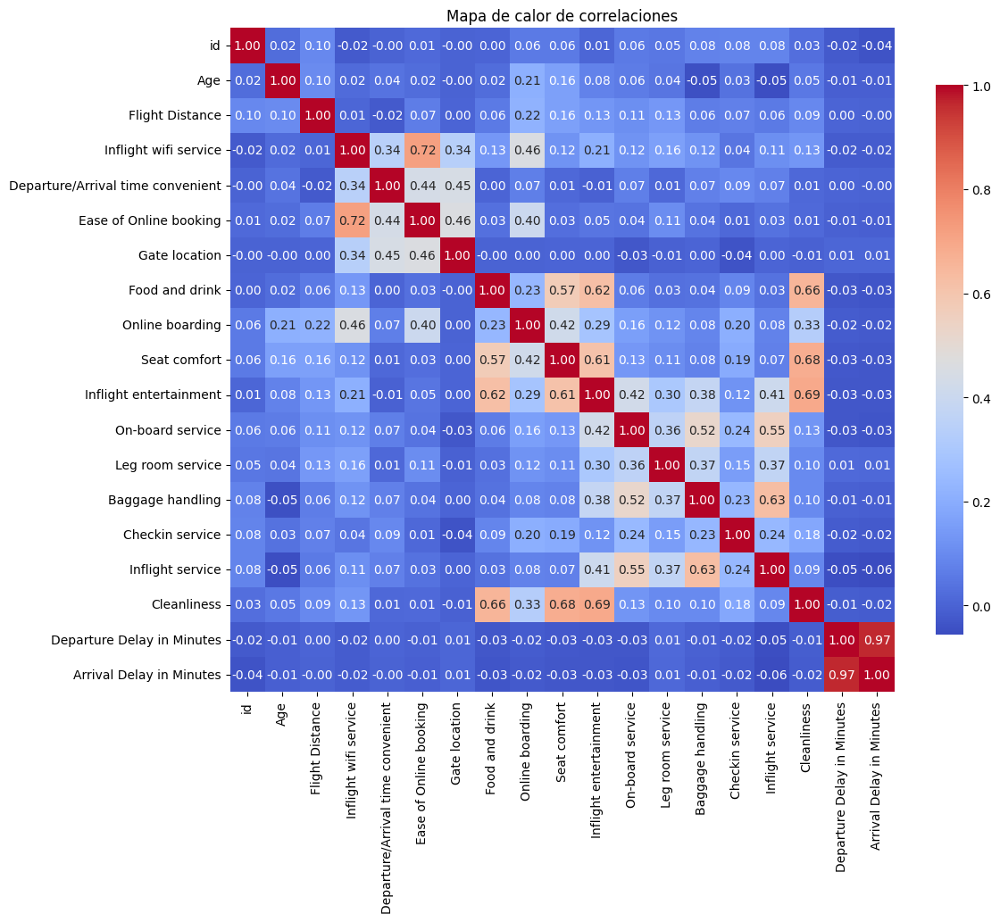

In [18]:
# Correlograma
import seaborn as sns
import matplotlib.pyplot as plt

# Matriz de correlación
corr = main_df.corr()

# Mapa de calor
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, cbar_kws={"shrink": .8})
plt.title("Mapa de calor de correlaciones")
plt.show()

Las 4 variables seleccionadas son: Flight distance, Arrival Delay in Minutes, Cleanliness, Ease of Online booking, ya que estas variables tienen una correlación baja entre sí y representan diferentes aspectos de la experiencia del pasajero, lo que puede ayudar a identificar patrones diversos en los datos.

In [19]:
# Selección de variables
selected_columns = ['Flight Distance', 'Arrival Delay in Minutes', 'Cleanliness', 'Ease of Online booking']
selected_data = main_df[selected_columns]

## 3. Preprocesamiento 🎭. [10 puntos]

<center>
<img src="https://media.tenor.com/R_WseIIwQ8QAAAAM/beavis-computer.gif" width=400>

Tras quedar satisfecho con los resultados presentados en el punto 2, el dueño de la empresa ha solicitado que se preprocesen los datos mediante un `pipeline`. Es crucial que este proceso tenga en cuenta las observaciones derivadas de los análisis anteriores. Adicionalmente, ha expresado su interés en visualizar el conjunto de datos en un gráfico de dos o tres dimensiones.

Basándose en los análisis realizados anteriormente:
1. Cree un `pipeline` que incluya PCA, utilizando las consideraciones mencionadas previamente para proyectar los datos a dos dimensiones. [4 puntos]
2. Grafique los resultados obtenidos y comente lo visualizado. [6 puntos]

**Respuestas:**

In [20]:
# Escriba su código aquí

# Pipeline de PCA
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
pca = PCA(n_components=2)
pipeline_pca = Pipeline(steps=[('pca', pca)])
pca_data = pipeline_pca.fit_transform(selected_data)

In [41]:
# Gráfico de dataset reducido
rng = np.random.default_rng(seed=42)  # Semilla para reproducibilidad
sample_pca = rng.choice(len(pca_data), size=500, replace=False)

sample_pca_data = pca_data[sample_pca]

fig = go.Figure()
fig.add_trace(
    go.Scatter(x=sample_pca_data[:,0], y=sample_pca_data[:,1], mode='markers', marker=dict(color='blue'), showlegend=False)
)
fig.update_layout(height=600, width=600,
                       title_text="Datos reducidos con PCA",
                       xaxis_title="Componente 1",
                       yaxis_title="Componente 2"
)
fig.show()

In [44]:
fig = go.Figure()

fig.add_trace(
    go.Histogram2dContour(
        x=sample_pca_data[:,0],
        y=sample_pca_data[:,1],
        colorscale='Viridis',
    )
)

fig.update_layout(
    height=600, width=600,
    title_text="Densidad de puntos (PCA)",
    xaxis_title="Componente 1",
    yaxis_title="Componente 2"
)
fig.show()

Se observa que los datos están muy concentrados en un punto y pareciera dificil distinguir clusters. A partir de ello, por lo que no se recomienda trabajar sobre solo estás dos dimensiones, ya que se perdería mucha información relevante para la segmentación.

## 4. Outliers 🚫🙅‍♀️❌🙅‍♂️ [10 puntos]

<center>
<img src="https://joachim-gassen.github.io/images/ani_sim_bad_leverage.gif" width=250>

Con el objetivo de mantener la claridad en su análisis, Don Mathias le ha solicitado entrenar un modelo que identifique pasajeros con comportamientos altamente atípicos.

1. Utilice `IsolationForest` para clasificar las anomalías del dataset (sin aplicar PCA), configurando el modelo para que sólo el 1% de los datos sean considerados anómalos. Asegúrese de integrar esta tarea dentro de un `pipeline`. [3 puntos]

2. Visualice los resultados en el gráfico de dos dimensiones previamente creado. [3 puntos]

3. ¿Cómo evaluaría el rendimiento de su modelo en la detección de anomalías? [4 puntos]

**Respuestas:**

In [45]:
# Escriba su código aquí
# import isolationForest
from sklearn.ensemble import IsolationForest
pipeline_isoforest = Pipeline(steps=[('isoforest', IsolationForest(contamination=0.01, random_state=42))])
isoforest_labels = pipeline_isoforest.fit_predict(selected_data)

# Gráfico de outliers detectados (sobre los mismos seleccionados aleatoriamente para la visualización de PCA)
sample_pca_data_labels = isoforest_labels[sample_pca]
fig = go.Figure()
fig.add_trace(
    go.Scatter(x=sample_pca_data[:,0], y=sample_pca_data[:,1], mode='markers', marker=dict(color=sample_pca_data_labels, colorscale='Viridis', showscale=True), showlegend=False)
)
fig.update_layout(height=600, width=600,
                       title_text="Outliers detectados con Isolation Forest",
                       xaxis_title="Componente 1",
                       yaxis_title="Componente 2"
)
fig.show()


El Isolation Forest ocupa el largo del arbol que aisla los puntos especificos, dentro de una variable particular. Los puntos outlier son aquellos con caminos más cortos en general. La forma corrrecta de evaluar que el modelo está correctamente detectando las anomalias, es verificar la robustés frente a una diferente selección de columnas en el paso 2.5, de esa forma se evita el sesgo que puede ser incluído por nostros. Otra forma que complemente la detección de anomalías es ocupar un método no basado en árboles de decisión para evaluar el set de datos seleccionado.

En forma paralela a lo anteriór, el desempeño del modelo parece ser bueno, ya que se logra ver que la gran mayoría de los puntos clasificados como normales son aquellos que tienen valor menor en en primer o segundo componente principal. Mientras que los más alejados del origen de los componentes principales son clasificados como anómalos. Aquellos puntos donde la clasificación sería más dudosa se deben al método ocupado, hay que evaluar la existencia de falsos negativos, es decir, puntos que son dificil de aislar pero corresponden a anomalías.

## 5. Métricas de Desempeño 🚀 [10 puntos]

<center>
<img src="https://i.imgflip.com/6xz0ij.gif" width=400>

Motivado por incrementar su fortuna, Don Mathias le solicita entrenar un modelo que le permita segmentar a los pasajeros en grupos distintos, con el objetivo de optimizar las diversas campañas de marketing diseñadas por su equipo. Para ello, le se pide realizar las siguientes tareas:

1. Utilizar el modelo **Gaussian Mixture** y explore diferentes configuraciones de número de clústers, específicamente entre 3 y 8. Asegúrese de integrar esta operación dentro de un `pipeline`. [4 puntos]
2. Explique cuál sería el criterio adecuado para seleccionar el número óptimo de clústers. **Justifique de forma estadistica y a traves de gráficos.** [6 puntos]

> **HINT:** Se recomienda investigar sobre los criterios AIC y BIC para esta tarea.

**Respuestas:**

In [46]:
# Escriba su código aquí
pipeline_GM = Pipeline(steps=[('gm', GaussianMixture(random_state=42))])
paramgrid = np.arange(3,9)
resultado = []
for i in paramgrid:
    print(f"etapa n={i}")
    ll = pipeline_GM.set_params(gm__n_components=i).fit(selected_data).score(selected_data)
    resultado.append(ll)

etapa n=3
etapa n=4
etapa n=5
etapa n=6
etapa n=7
etapa n=8


In [47]:
#Cálculo de AIC
aic = 2*paramgrid- 2*np.array(resultado)
aic

array([28.31987037, 30.10982817, 32.00805778, 33.98822662, 35.91971091,
       37.60618875])

In [48]:
px.line(x=paramgrid,y=aic, title="AIC[y] vs n° de clusters[x] para modelos de GMM")


Estadisticamente, ocupando la métrica AIC, el mejor valor se obtiene a un número de clusters de tres. Para igual log-likelihood y n° de datos, BIC da los mismos resultados que AIC.

## 6. Análisis de resultados 📊 [10 puntos]

<center>
<img src="https://i.pinimg.com/originals/5b/03/4e/5b034e96d84c6c6b57a9a04ca14aac02.gif" width=400>

Una vez identificado el número óptimo de clústers, se le pide realizar lo siguiente:

1. Utilizar la proyección en dos dimensiones para visualizar cada clúster claramente. [2 puntos]

2. ¿Es posible distinguir claramente entre los clústers generados? [2 puntos]

3. Proporcionar una descripción breve de cada clúster utilizando estadísticas descriptivas básicas, como la media y la desviación estándar, para resumir las características de las variables utilizadas en estos algoritmos. [2 puntos]

4. Proceda a visualizar los clústers en tres dimensiones para una perspectiva más detallada. [2 puntos]

5. ¿Cómo afecta esto a sus conclusiones anteriores? [2 puntos]

**Respuestas:**

In [49]:
# Escriba su código aquí
y_gmm_pred = pipeline_GM.set_params(gm__n_components=3).fit_predict(selected_data)
sy_gmm_pred =y_gmm_pred[sample_pca]
px.scatter(x=sample_pca_data[:,0], y=sample_pca_data[:,1], color=sy_gmm_pred)
fig = go.Figure()
fig.add_trace(
    go.Scatter(x=sample_pca_data[:,0], y=sample_pca_data[:,1], mode='markers', marker=dict(color=sy_gmm_pred, colorscale='Viridis', showscale=True), showlegend=False)
)
fig.update_layout(height=600, width=600,
                       title_text="Outliers detectados con Isolation Forest",
                       xaxis_title="Componente 1",
                       yaxis_title="Componente 2"
)
fig.show()

Si se puede distinguir entre los clusters, visualmente: Un cluster está en  componente 2 ~ -15; Un segundo cluster está en el origen y a valores negatgivos de componente 1; El tercer cluster  se encuntra a valores superiores del componente 2 comparado con los clusters anteriores.

In [50]:
descripcion = pd.DataFrame()
model = GaussianMixture(n_components=3, random_state=42).fit(selected_data)
for i in np.arange(0,3):
    descripcion[f"mean cluster {i}"]= np.mean(selected_data[i==y_gmm_pred],axis=0)
    descripcion[f"sd cluster {i}"]=  np.std(selected_data[i==y_gmm_pred],axis=0)
descripcion

,mean cluster 0,sd cluster 0,mean cluster 1,sd cluster 1,mean cluster 2,sd cluster 2
Flight Distance,615.640620,345.170885,1806.385112,1094.782937,1196.353546,1003.076003
Arrival Delay in Minutes,13.530602,10.630434,58.050899,67.771371,0.000000,0.000000
Cleanliness,3.182833,1.337642,3.314324,1.290903,3.318218,1.306974
Ease of Online booking,2.687844,1.347723,2.795105,1.414037,2.773633,1.412981


In [51]:
for i in np.arange(0,3):
    descripcion[f"mean cluster {i}"]= np.mean(selected_data[i==y_gmm_pred],axis=0)
    descripcion[f"sd cluster {i}"]=  np.std(selected_data[i==y_gmm_pred],axis=0)
descripcion

,mean cluster 0,sd cluster 0,mean cluster 1,sd cluster 1,mean cluster 2,sd cluster 2
Flight Distance,615.640620,345.170885,1806.385112,1094.782937,1196.353546,1003.076003
Arrival Delay in Minutes,13.530602,10.630434,58.050899,67.771371,0.000000,0.000000
Cleanliness,3.182833,1.337642,3.314324,1.290903,3.318218,1.306974
Ease of Online booking,2.687844,1.347723,2.795105,1.414037,2.773633,1.412981


In [62]:
model.covariances_

array([[[ 1.27075379e+05, -1.57328835e+02,  1.10972357e+01,
          2.15380653e+01],
        [-1.57328835e+02,  1.16425488e+02, -5.82361315e-01,
         -1.61991326e-01],
        [ 1.10972357e+01, -5.82361315e-01,  1.78990736e+00,
          3.25786608e-02],
        [ 2.15380653e+01, -1.61991326e-01,  3.25786608e-02,
          1.81959093e+00]],

       [[ 1.20585146e+06, -2.41685027e+04,  1.32897214e+02,
          1.12728795e+02],
        [-2.41685027e+04,  4.47499437e+03, -3.01621457e+00,
         -2.60903886e+00],
        [ 1.32897214e+02, -3.01621457e+00,  1.67187147e+00,
          1.07091541e-02],
        [ 1.12728795e+02, -2.60903886e+00,  1.07091541e-02,
          1.98850119e+00]],

       [[ 1.00616696e+06,  0.00000000e+00,  1.33964080e+02,
          8.97960267e+01],
        [ 0.00000000e+00,  1.00000000e-06,  0.00000000e+00,
          0.00000000e+00],
        [ 1.33964080e+02,  0.00000000e+00,  1.70817798e+00,
          2.79235050e-02],
        [ 8.97960267e+01,  0.00000000e+

Mucho éxito!

<center>
<img src="https://i.pinimg.com/originals/55/3d/42/553d42bea9b10e0662a05aa8726fc7f4.gif" width=300>